<a href="https://colab.research.google.com/github/Manos-Mak120/-/blob/Wordclouds/BIDEN(21)_WORDCLOUDS.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import requests
from bs4 import BeautifulSoup
import pandas as pd

import time
import random

from tqdm import tqdm

In [ ]:
def get_webpage_soup(url):
  headers = {
        "User-Agent": "Mozilla/5.0"
    }
  response = requests.get(url, headers=headers)
  if response.status_code != 200:
    return None
  else:
    return BeautifulSoup(response.text, 'html.parser')

In [ ]:
def get_article_elements_from_soup(soup, article_url):
    # title
    try:
        title = soup.find("h1").text.strip()
    except:
        title = ""

    # datetime
    try:
        datetime_str = soup.find("time")["datetime"]
        date_str = datetime_str.split("T")[0]
        time_str = datetime_str.split("T")[1].split("+")[0]
    except:
        date_str = ""
        time_str = ""

    # section
    try:
        section_div = soup.find("div", class_="main-category-block") or soup.find("div", class_="main-category")
        section = section_div.text.strip() if section_div else ""
    except:
        section = ""

    # author
    try:
      author_tag = soup.find("a", class_="author-name") or soup.find("span", class_="author-name")
      author = author_tag.text.strip() if author_tag else ""
    except:
        author = ""
    # excerpt
    try:
        excerpt_div = soup.find("div", class_="p.main-intro") or soup.find(itemprop="description") or soup.find("div", class_="nx-excerpt")
        excerpt = excerpt_div.text.strip() if excerpt_div else ""
    except:
        excerpt = ""

    # text body
    try:
      content_div = soup.find("div", class_="main-text story-fulltext")
      elements = content_div.find_all(["p", "h2", "h3", "ul", "ol", "li"]) if content_div else []
      text_body = " ".join(el.get_text(strip=True) for el in elements if el.get_text(strip=True))
    except:
        text_body = ""

    # feature image
    try:
        img_block = soup.find("div", class_="article-image") or soup.find("figure")
        feat_img_link = img_block.find("img")["src"] if img_block and img_block.find("img") else ""
    except:
        feat_img_link = ""

    # image caption
    try:
        caption_div = soup.find("div", class_="image-caption") or soup.find("figcaption")
        image_caption = caption_div.text.strip() if caption_div else ""
    except:
        image_caption = ""

    articleD = {
        "article_url": article_url,
        "title": title,
        "date": date_str,
        "time": time_str,
        "section": section,
        "author": author,
        "excerpt": excerpt,
        "text_body": text_body,
        "feat_img_link": feat_img_link,
        "feat_img_cation": image_caption
    }

    return articleD

In [ ]:
def scrape_newsbomb_articles_pages(biden_21):
  all_articles_dataL = []
  base_url = "newbomb"
  for idx, row in tqdm(biden_21.iterrows(), total=biden_21.shape[0], desc="Processing rows"):
    article_url_relative = row['article_url']
    article_url = base_url + article_url_relative
    soup = get_webpage_soup(article_url)
    if soup:
     articleD = get_article_elements_from_soup(soup, article_url)
     all_articles_dataL.append(articleD)
     delay = random.uniform(1, 3)
     time.sleep(delay)
  df = pd.DataFrame(all_articles_dataL)
  print(f"\nScraping completed. Fetshed {len(df)} articles.")
  return df

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
biden_21 = pd.read_csv("/content/drive/MyDrive/Εργασία Python/scrappers/BIDEN(21)-SCRAPER.CSV")

In [ ]:
biden_21

,title,article_url,date,time,section,excerpt
0,Μπάιντεν: Διάγγελμα για το Αφγανιστάν- O Αμερι...,https://www.newsbomb.gr/kosmos/story/1228361/m...,2021-08-31,22:55,ΚΟΣΜΟΣ,Mήνυμα στον αμερικανικό λαό απηύθυνε ο πρόεδρο...
1,Μπλίνκεν: Θα συνεργαστούμε με τους Ταλιμπάν εά...,https://www.newsbomb.gr/kosmos/story/1228111/m...,2021-08-31,06:15,ΚΟΣΜΟΣ,«Κάθε βήμα που θα κάνουμε δεν θα βασίζεται στο...
2,Νέο διάγγελμα Μπάιντεν για το Αφγανιστάν,https://www.newsbomb.gr/kosmos/story/1228104/n...,2021-08-31,02:00,ΚΟΣΜΟΣ,Ο αμερικανός πρόεδρος Τζο Μπάιντεν θα εκφραστε...
3,Τυφώνας Άιντα: Η στιγμή που οι σφοδροί άνεμοι ...,https://www.newsbomb.gr/kosmos/story/1227974/t...,2021-08-30,15:17,ΚΟΣΜΟΣ,Ο τυφώνας Άιντα έφθασε πάνω από το έδαφος όντα...
4,Σάλος με τον Μπαίντεν να κοιτά το ρολόι του στ...,https://www.newsbomb.gr/kosmos/story/1227963/s...,2021-08-30,14:45,ΚΟΣΜΟΣ,Πύρα δέχεται ο πρόεδρος των ΗΠΑ Τζο Μπάιντεν μ...
...,...,...,...,...,...,...
906,Εκλογές ΗΠΑ 2020: Όλα τα μάτια στραμμένα στο π...,https://www.newsbomb.gr/kosmos/story/1121995/e...,2020-09-28,19:22,ΚΟΣΜΟΣ,Σε λίγες ώρες (4 τα ξημερώματα ώρα Ελλάδος) θα...
907,Αμερικανικές εκλογές 2020: «Θρίλερ» στις κρίσι...,https://www.newsbomb.gr/kosmos/story/1121668/a...,2020-09-27,19:45,ΚΟΣΜΟΣ,"Το προβάδισμα του Τζο Μπάιντεν, του υποψηφίου ..."
908,Τραμπ: Ο Τζο Μπάιντεν ντοπάρεται για να δίνει ...,https://www.newsbomb.gr/kosmos/story/1117092/t...,2020-09-12,06:15,ΚΟΣΜΟΣ,"Ο πρόεδρος των ΗΠΑ Ντόναλντ Τραμπ, χωρίς ακόμη..."
909,Ο πρόεδρος Τραμπ και ο πρώην αντιπρόεδρος Τζο ...,https://www.newsbomb.gr/kosmos/story/1117065/o...,2020-09-11,23:57,ΚΟΣΜΟΣ,Ο υποψήφιος των Δημοκρατικών για την προεδρία ...


In [ ]:
biden_21.dtypes

,0
title,object
article_url,object
date,object
time,object
section,object
excerpt,object


In [ ]:
biden_21['date'] = pd.to_datetime(biden_21['date'], format='%Y-%m-%d')
biden_21.dtypes

,0
title,object
article_url,object
date,datetime64[ns]
time,object
section,object
excerpt,object


In [ ]:
biden_21['title'] = biden_21['title'].astype(str).fillna('')
biden_21['excerpt'] = biden_21['excerpt'].astype(str).fillna('')

biden_21["text"] = biden_21[['title', 'excerpt']].agg('. '.join, axis=1)  #axis=1 γίνεται σε όλα τα rows axis=0 σε στηλες
biden_21.loc[0, 'text']

'Μπάιντεν: Διάγγελμα για το Αφγανιστάν- O Αμερικανός προέδρος υπεραμύνεται του χάους που δημιούργησε. Mήνυμα στον αμερικανικό λαό απηύθυνε ο πρόεδρος Μπάιντεν, την ημέρα που και οι τελευταίοι στρατιώτες των ΗΠΑ εγκατέλειψαν το Αφγανιστάν.'

In [ ]:
short_df = biden_21[['date', 'text']]
short_df.head()

,date,text
0,2021-08-31,Μπάιντεν: Διάγγελμα για το Αφγανιστάν- O Αμερι...
1,2021-08-31,Μπλίνκεν: Θα συνεργαστούμε με τους Ταλιμπάν εά...
2,2021-08-31,Νέο διάγγελμα Μπάιντεν για το Αφγανιστάν. Ο αμ...
3,2021-08-30,Τυφώνας Άιντα: Η στιγμή που οι σφοδροί άνεμοι ...
4,2021-08-30,Σάλος με τον Μπαίντεν να κοιτά το ρολόι του στ...


In [ ]:
biden_21['year'] = pd.DatetimeIndex(biden_21['date']).year
biden_21['month'] = pd.DatetimeIndex(biden_21['date']).month
biden_21['day'] = pd.DatetimeIndex(biden_21['date']).day

biden_nov_jan_teasers = biden_21[
    (biden_21['month'] == 11) |
    (biden_21['month'] == 12) |
    (biden_21['month'] == 1)  |
    (biden_21['month'] == 2) |
    (biden_21["month"] == 3) |
    (biden_21["month"] == 4)
]
biden_nov_jan_teasers

,title,article_url,date,time,section,excerpt,text,year,month,day
286,Τζο Μπάιντεν: Αναποφάσιστος ως προς τον υποχρε...,https://www.newsbomb.gr/kosmos/story/1191654/t...,2021-04-30,15:52,ΚΟΣΜΟΣ,Ο πρόεδρος Μπάιντεν δεν έχει αποφασίσει σχετικ...,Τζο Μπάιντεν: Αναποφάσιστος ως προς τον υποχρε...,2021,4,30
287,ΗΠΑ: Οι Αμερικανοί στηρίζουν τα οικονομικά μέτ...,https://www.newsbomb.gr/kosmos/story/1191396/h...,2021-04-29,23:50,ΚΟΣΜΟΣ,Η πλειονότητα των Αμερικανών στηρίζει τα οικον...,ΗΠΑ: Οι Αμερικανοί στηρίζουν τα οικονομικά μέτ...,2021,4,29
288,ΗΠΑ: Η Αμερική «πάει μπροστά» λέει ο Μπάιντεν ...,https://www.newsbomb.gr/kosmos/story/1191143/h...,2021-04-29,08:51,ΚΟΣΜΟΣ,"Σαρωτικές προτάσεις για θέσεις εργασίας, εκπαί...",ΗΠΑ: Η Αμερική «πάει μπροστά» λέει ο Μπάιντεν ...,2021,4,29
289,ΗΠΑ: Γράφτηκε ιστορία στο Κογκρέσο - Πίσω από ...,https://www.newsbomb.gr/kosmos/story/1191106/h...,2021-04-29,06:44,ΚΟΣΜΟΣ,Κάτι που δεν έχει ξανασυμβεί διαδραματίστηκε τ...,ΗΠΑ: Γράφτηκε ιστορία στο Κογκρέσο - Πίσω από ...,2021,4,29
290,Ο Κιλιντσάρογλου «σφυροκοπά» τον Ερντογάν – «Α...,https://www.newsbomb.gr/kosmos/story/1190753/o...,2021-04-28,10:19,ΚΟΣΜΟΣ,Επίθεση στον Ρετζέπ Ταγίπ Ερντογάν εξαπέλυσε η...,Ο Κιλιντσάρογλου «σφυροκοπά» τον Ερντογάν – «Α...,2021,4,28
...,...,...,...,...,...,...,...,...,...,...
845,Εκλογές ΗΠΑ 2020 - Δημοσκόπηση: Προβάδισμα 7 μ...,https://www.newsbomb.gr/kosmos/story/1132775/e...,2020-11-01,21:43,ΚΟΣΜΟΣ,Εκλογές ΗΠΑ 2020: Στην τελική ευθεία η μάχη Τρ...,Εκλογές ΗΠΑ 2020 - Δημοσκόπηση: Προβάδισμα 7 μ...,2020,11,1
846,Εκλογές ΗΠΑ 2020: Τραμπ εναντίον Μπάιντεν – Τι...,https://www.newsbomb.gr/kosmos/story/1132686/e...,2020-11-01,14:25,ΚΟΣΜΟΣ,Προεδρικές Εκλογές ΗΠΑ 2020: Ένα 48ωρο πριν απ...,Εκλογές ΗΠΑ 2020: Τραμπ εναντίον Μπάιντεν – Τι...,2020,11,1
847,Εκλογές ΗΠΑ 2020: Ο Τραμπ επιτίθεται στον «κοι...,https://www.newsbomb.gr/kosmos/story/1132681/e...,2020-11-01,13:55,ΚΟΣΜΟΣ,Εκλογές ΗΠΑ 2020: Ο Ντόναλντ Τραμπ υποστήριξε ...,Εκλογές ΗΠΑ 2020: Ο Τραμπ επιτίθεται στον «κοι...,2020,11,1
848,Εκλογές ΗΠΑ 2020: Κορυφώνεται η μάχη Τραμπ vs ...,https://www.newsbomb.gr/kosmos/story/1132645/e...,2020-11-01,11:16,ΚΟΣΜΟΣ,Εκλογές ΗΠΑ 2020: Δυο ημέρες πριν κλείσουν οι ...,Εκλογές ΗΠΑ 2020: Κορυφώνεται η μάχη Τραμπ vs ...,2020,11,1


In [ ]:
short_dff = short_df.copy()
short_df['year'] = pd.DatetimeIndex(short_df['date']).year
short_df['month'] = pd.DatetimeIndex(short_df['date']).month
short_df['day'] = pd.DatetimeIndex(short_df['date']).day
short_df.head()

<ipython-input-14-3495311681>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  short_df['year'] = pd.DatetimeIndex(short_df['date']).year
<ipython-input-14-3495311681>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  short_df['month'] = pd.DatetimeIndex(short_df['date']).month
<ipython-input-14-3495311681>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas

,date,text,year,month,day
0,2021-08-31,Μπάιντεν: Διάγγελμα για το Αφγανιστάν- O Αμερι...,2021,8,31
1,2021-08-31,Μπλίνκεν: Θα συνεργαστούμε με τους Ταλιμπάν εά...,2021,8,31
2,2021-08-31,Νέο διάγγελμα Μπάιντεν για το Αφγανιστάν. Ο αμ...,2021,8,31
3,2021-08-30,Τυφώνας Άιντα: Η στιγμή που οι σφοδροί άνεμοι ...,2021,8,30
4,2021-08-30,Σάλος με τον Μπαίντεν να κοιτά το ρολόι του στ...,2021,8,30


In [ ]:
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt

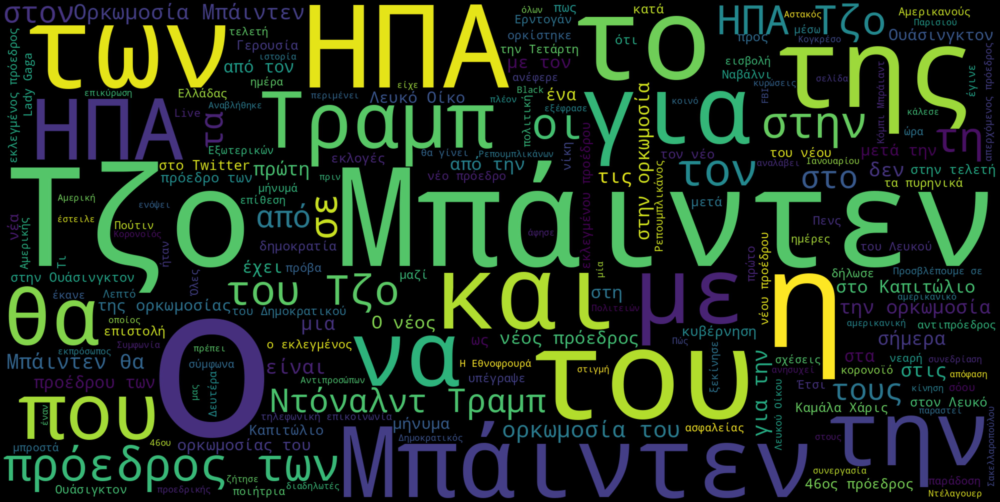

In [ ]:
wordcloud = WordCloud(  #ενώνει όλα τα κείμενα μαζί για να μας φέρει το wordcloud
    stopwords = STOPWORDS, # <- τα stopwords που θέλουμε να κοπούν
    width = 2000,
    height = 1000,
    background_color = 'black'
 ).generate(jan_text) # <- μέσα στην παρένθεση βάζουμε το όνομα της μεταβλητής του κειμένου
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

In [ ]:
list(STOPWORDS)[0:20]

["weren't",
 'in',
 'from',
 'was',
 "who's",
 "how's",
 "he's",
 'the',
 'were',
 'her',
 'again',
 "didn't",
 "she's",
 "i'll",
 'out',
 'very',
 "he'll",
 'can',
 "what's",
 'not']

In [ ]:
import spacy

In [ ]:
# Κατέβασμα του μικρού πακέτου της ελληνικής γλώσσας, το οποίο είναι εκπαιδευμένο σε ειδησεογραφικά κείμενα.  #ΠΡΟΣΟΧΗ ΕΔΩ
!python -m spacy download el_core_news_sm

# Αν η παρακάτω εντολή δεν δουλεύει, κάνουμε Runtime ->  Restart Runtime, για να δει τις αλλαγές από το download...

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.6/12.6 MB 57.6 MB/s eta 0:00:00
✔ Download and installation successful
You can now load the package via spacy.load('el_core_news_sm')
⚠ Restart to reload dependencies
If you are in a Jupyter or Colab notebook, you may need to restart Python in
order to load all the package's dependencies. You can do this by selecting the
'Restart kernel' or 'Restart runtime' option.


In [ ]:
nlp = spacy.load('el_core_news_sm')

In [ ]:
print(sorted(nlp.Defaults.stop_words)[0:20]) # τα 20 πρώτα

['άλλα', 'άλλες', 'άλλη', 'άλλην', 'άλλης', 'άλλο', 'άλλοι', 'άλλον', 'άλλος', 'άλλοτε', 'άλλους', 'άλλων', 'άμα', 'άμεσα', 'άνευ', 'άνω', 'άξαφνα', 'άρα', 'άραγε', 'έγιναν']


In [ ]:
def create_wordcloud(text):
  wordcloud = WordCloud(
      stopwords = nlp.Defaults.stop_words,
      width = 2000,
      height = 1000,
      background_color = 'black'
  ).generate(text)
  return wordcloud

Φτιάχνω ξεχωριστό function για το wordcloud γιατί μπορεί να θέλω να δω κάτι στο wordcloud και όχι απαραίτητα να το κάνω εικόνα.

In [ ]:
wcloud = create_wordcloud(jan_text)
list(wcloud.words_.items())[:5]

[('ΗΠΑ', 1.0),
 ('Τζο Μπάιντεν', 0.9263157894736842),
 ('Μπάιντεν', 0.6421052631578947),
 ('ορκωμοσία', 0.3263157894736842),
 ('Τραμπ', 0.29473684210526313)]

In [ ]:
def create_wordcloud_img(text):
  wordcloud = create_wordcloud(text)
  fig = plt.figure(
      figsize = (40, 30),
      facecolor = 'k',
      edgecolor = 'k')
  return plt.imshow(wordcloud)

Τώρα μπορώ να φτιάχνω wordclouds με μια μόνο εντολή (καλώντας το function που έφτιαξα και βάζοντας στην παρένθεση το όνομα της μεταβλητής του text που θέλω κάθε φορά)

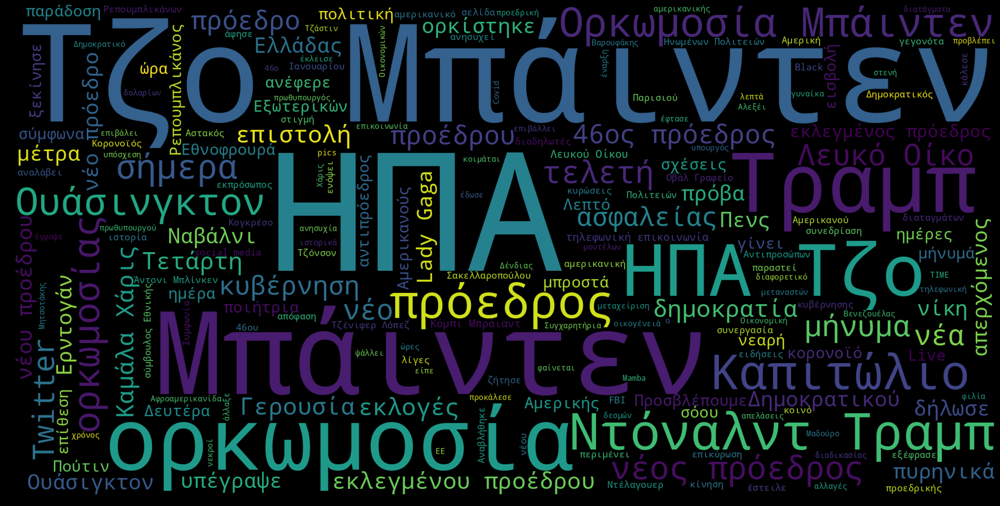

In [ ]:
create_wordcloud_img(jan_text)

In [ ]:
custom_stopwords = {'εκλογές',"Τζο" 'Μπαίντεν', 'Κόμπι Μπραιάντ',"Τραμπ","Ντόναλντ"}

for word in custom_stopwords:
   if word not in nlp.Defaults.stop_words:
     nlp.Defaults.stop_words.add(word)
     lex_attr = nlp.vocab[word]
     lex_attr.is_stop = True

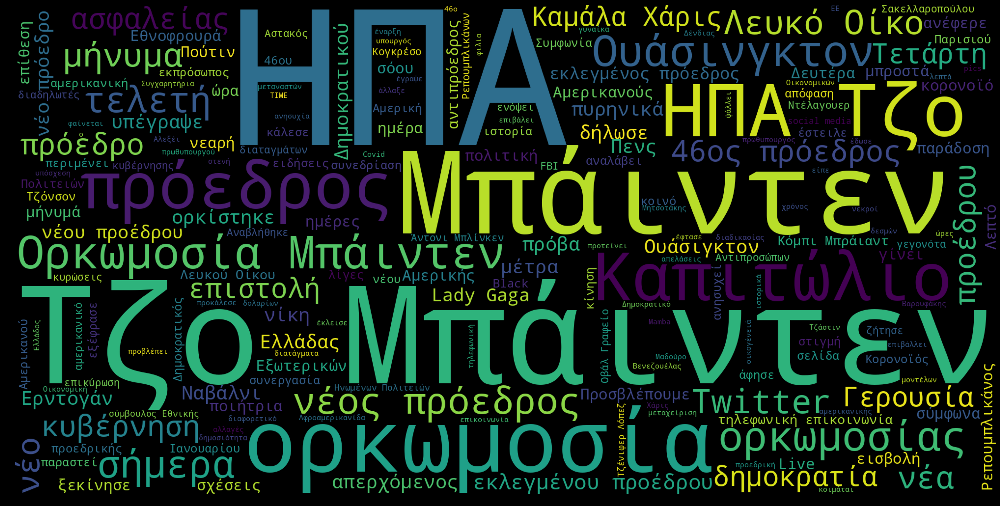

In [ ]:
create_wordcloud_img(jan_text)

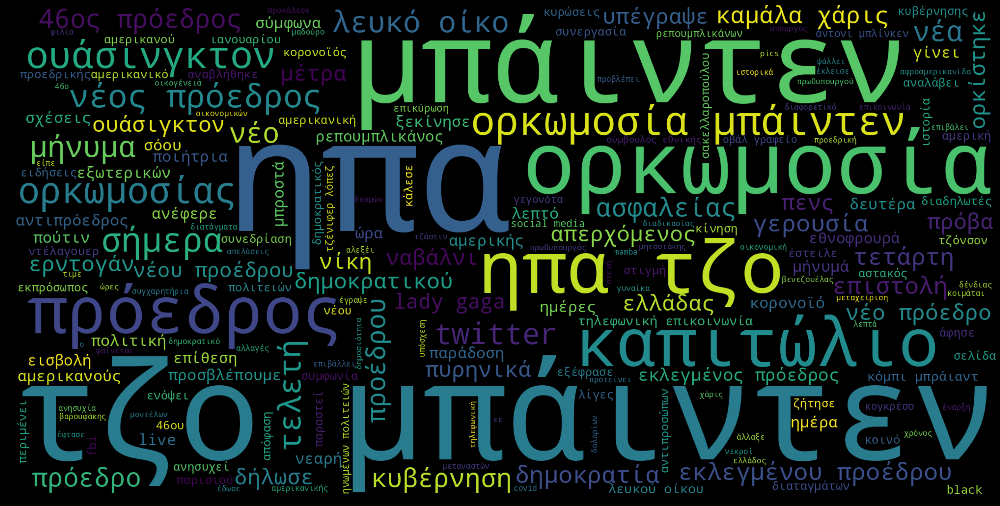

In [ ]:
jan_text_lower = jan_text.lower()
create_wordcloud_img(jan_text_lower)

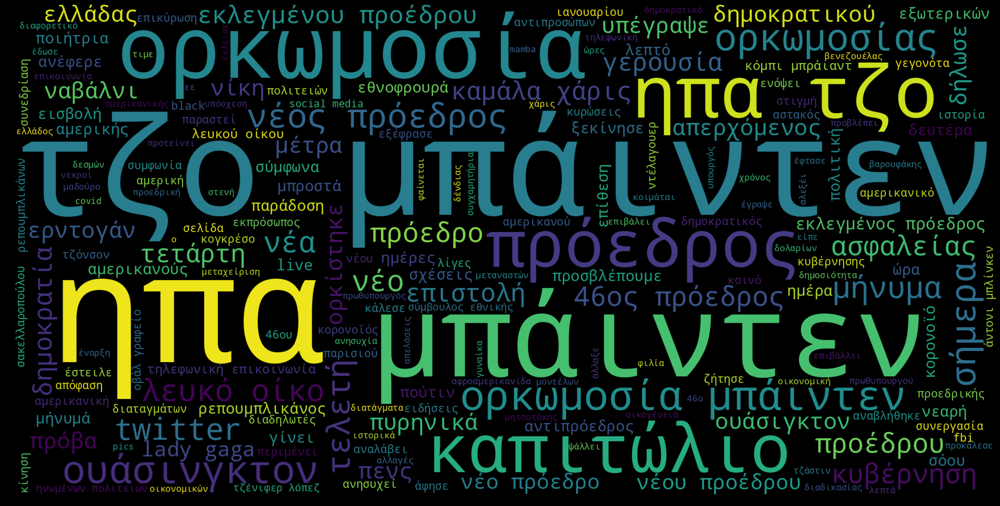

In [ ]:
jan_text_lower = jan_text_lower.replace("ορκομωσία", "ορκομωσίας")
create_wordcloud_img(jan_text_lower)

In [ ]:
jan_doc = nlp(jan_text_lower)

for token in jan_doc[:10]:
    print(f"{token.text} -> {token.lemma_} ({token.pos_})")

ηπα -> ΗΠΑ (NOUN)
: -> : (PUNCT)
ο -> ο (DET)
μπάιντεν -> μπάιντεν (ADJ)
θα -> θα (AUX)
αναθεωρήσει -> αναθεωρήζω (VERB)
την -> ο (DET)
πολιτική -> πολιτική (ADJ)
τραμπ -> τραμπ (NOUN)
απέναντι -> απέναντι (ADV)


In [ ]:
tokenized_jan_doc = ' '.join(token.lemma_ for token in jan_doc)

In [ ]:
print(jan_text[:200])

print(tokenized_jan_doc[:200])

ΗΠΑ: Ο Μπάιντεν θα αναθεωρήσει την πολιτική Τραμπ απέναντι στην Κούβα. Ξεκινάει τις αλλαγές ο νέος πρόεδρος των ΗΠΑ. ΗΠΑ: Ο Μπάιντεν μετέφερε στον Πούτιν την ανησυχία του για τον Ναβάλνι. Στην τηλεφων
ΗΠΑ : ο μπάιντεν θα αναθεωρήζω ο πολιτική τραμπ απέναντι σε ο Κούβα . ξεκινάει ο αλλαγή ο νέος πρόεδρος ο ΗΠΑ . ΗΠΑ : ο μπάιντεν μεταφέρω σε ο πούτιν ο ανησυχία μου για ο ναβάλνι . σε ο τηλεφωνικός μο


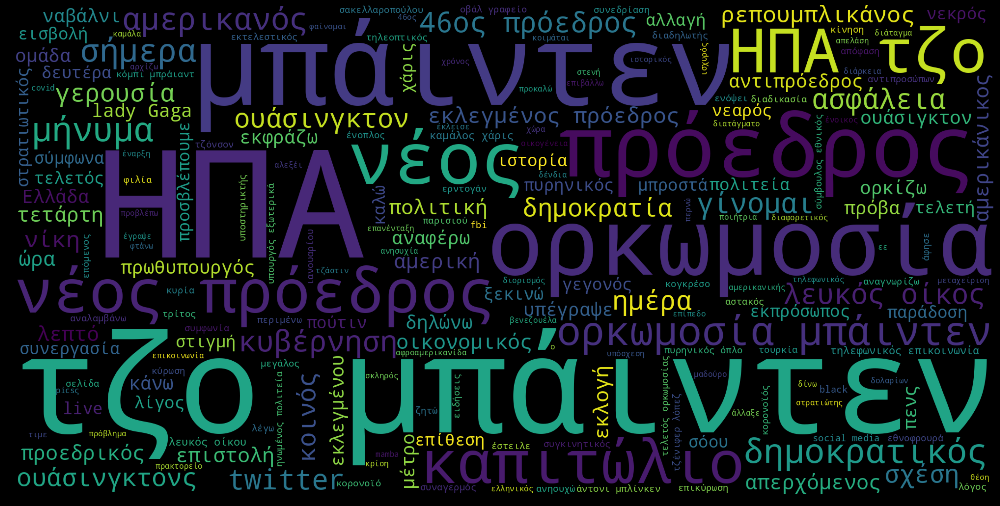

In [ ]:
create_wordcloud_img(tokenized_jan_doc)

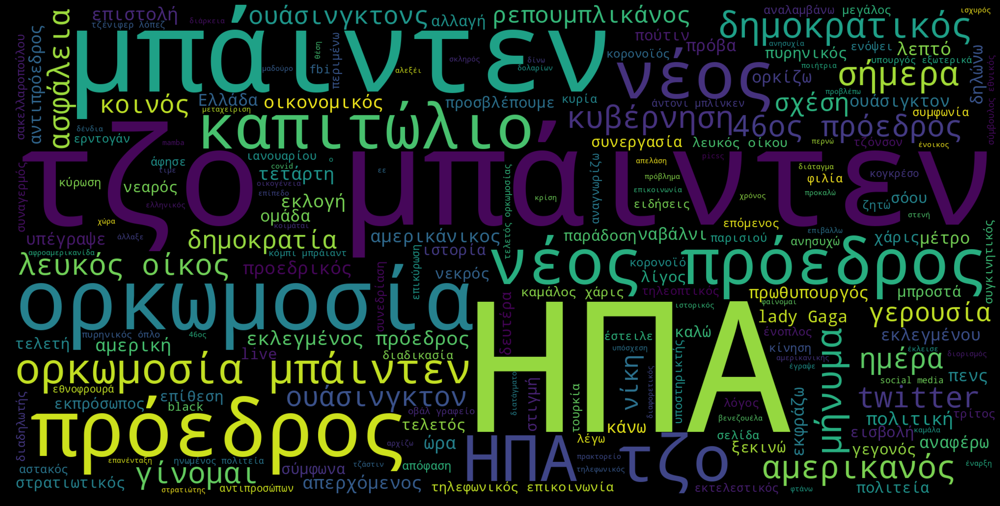

In [ ]:
nlp.Defaults.stop_words.add("εισβολής")
create_wordcloud_img(tokenized_jan_doc)

Αν θέλουμε, μπορούμε να πάρουμε τις λέξεις και τις σχετικές συχνότητές τους σε dataframe.

In [ ]:
wordcloud = create_wordcloud(tokenized_jan_doc)
frequencies = wordcloud.words_
print(frequencies)

{'ΗΠΑ': 1.0, 'τζο μπάιντεν': 0.9263157894736842, 'μπάιντεν': 0.6210526315789474, 'ορκωμοσία': 0.4105263157894737, 'πρόεδρος': 0.3473684210526316, 'νέος': 0.24210526315789474, 'νέος πρόεδρος': 0.22105263157894736, 'ΗΠΑ τζο': 0.22105263157894736, 'καπιτώλιο': 0.21052631578947367, 'ορκωμοσία μπάιντεν': 0.2, 'δημοκρατικός': 0.1368421052631579, 'μήνυμα': 0.1368421052631579, 'σήμερα': 0.12631578947368421, 'αμερικανός': 0.11578947368421053, 'κυβέρνηση': 0.10526315789473684, 'twitter': 0.09473684210526316, 'γίνομαι': 0.09473684210526316, 'ασφάλεια': 0.09473684210526316, 'λευκός οίκος': 0.09473684210526316, '46ος πρόεδρος': 0.09473684210526316, 'ημέρα': 0.08421052631578947, 'ουάσινγκτον': 0.08421052631578947, 'γερουσία': 0.07368421052631578, 'ουάσινγκτονς': 0.07368421052631578, 'κοινός': 0.07368421052631578, 'σχέση': 0.07368421052631578, 'δημοκρατία': 0.07368421052631578, 'ρεπουμπλικάνος': 0.07368421052631578, 'νίκη': 0.07368421052631578, 'εκλεγμένος πρόεδρος': 0.07368421052631578, 'πολιτική': 

In [ ]:
wc_df = pd.DataFrame(frequencies.items(), columns=["λέξη", "σχετική συχνότητα"])
wc_df

,λέξη,σχετική συχνότητα
0,ΗΠΑ,1.000000
1,τζο μπάιντεν,0.926316
2,μπάιντεν,0.621053
3,ορκωμοσία,0.410526
4,πρόεδρος,0.347368
...,...,...
195,υπόσχεση,0.021053
196,φαίνομαι,0.021053
197,κοιμάται,0.021053
198,αφροαμερικανίδα,0.021053


In [ ]:
jan_doc.ents

(ηπα,
 τραμπ,
 ηπα,
 ηπα,
 ηπα,
 ηπα,
 ηπα,
 τραμπ,
 ηπα,
 ηπα,
 ηπα,
 ηπα,
 τραμπ,
 ηπα,
 ντόναλντ τραμπ,
 ηπα,
 ηπα,
 ελλάδας,
 ηπα,
 twitter,
 ηπα,
 ηπα,
 ντόναλντ τραμπ,
 ντοναλντ τραμπ,
 ηπα,
 ηπα,
 ηπα,
 τραμπ,
 ηπα,
 ηπα,
 οηε,
 ηπα,
 ηπα,
 ηπα,
 ηπα,
 ελλάδας,
 ηπα,
 ηπα,
 ελλάδας,
 ηπα,
 ηπα,
 ηπα,
 ηπα,
 twitter,
 ηπα,
 ηπα,
 τραμπ,
 twitter,
 ηπα,
 ηπα,
 ελλάδας,
 ηπα,
 twitter,
 ηπα,
 ηπα,
 ηπα,
 ηπα,
 τραμπ,
 ντόναλντ τραμπ,
 ηπα,
 ντόναλντ τραμπ,
 ελλάδας,
 ηπα,
 ηπα,
 τραμπ,
 ντόναλντ τραμπ,
 ηπα,
 ηπα,
 τραμπ,
 τραμπ,
 ηπα,
 τραμπ,
 τραμπ,
 ντόναλντ τραμπ,
 τραμπ,
 ευρώπη,
 ηπα,
 ηπα,
 ηπα,
 ηπα,
 ηπα,
 ηπα,
 τραμπ,
 ηπα,
 ντόναλντ τραμπ,
 τραμπ,
 ηπα,
 ντόναλντ τραμπ,
 ηπα,
 ηπα,
 ηπα,
 ουάσιγκτον,
 ευρώπη,
 ηπα,
 ηπα,
 ηπα,
 τραμπ,
 ηπα,
 ντόναλντ τραμπ,
 τραμπ,
 τραμπ,
 ηπα,
 ηπα,
 ηπα,
 ηπα,
 ηπα,
 ηπα,
 ηπα,
 τουρκία,
 τουρκία,
 ηπα,
 ηπα,
 national mall,
 ρετζέπ ταγίπ,
 ηπα,
 ηπα,
 ηπα,
 ηπα,
 ηπα,
 ηπα,
 τραμπ,
 ηπα,
 ηπα,
 τραμπ,
 ντόναλντ τραμπ,
 τραμπ,
 ντόναλ

In [ ]:
for ent in jan_doc.ents:
  print(ent.text, ent.label_)

ηπα GPE
τραμπ PERSON
ηπα GPE
ηπα GPE
ηπα GPE
ηπα GPE
ηπα GPE
τραμπ PERSON
ηπα GPE
ηπα GPE
ηπα GPE
ηπα GPE
τραμπ PERSON
ηπα GPE
ντόναλντ τραμπ PERSON
ηπα GPE
ηπα GPE
ελλάδας GPE
ηπα GPE
twitter PRODUCT
ηπα GPE
ηπα GPE
ντόναλντ τραμπ PERSON
ντοναλντ τραμπ PERSON
ηπα GPE
ηπα GPE
ηπα GPE
τραμπ PERSON
ηπα GPE
ηπα GPE
οηε ORG
ηπα GPE
ηπα GPE
ηπα GPE
ηπα GPE
ελλάδας GPE
ηπα GPE
ηπα GPE
ελλάδας GPE
ηπα GPE
ηπα GPE
ηπα GPE
ηπα GPE
twitter ORG
ηπα GPE
ηπα GPE
τραμπ PERSON
twitter ORG
ηπα GPE
ηπα GPE
ελλάδας GPE
ηπα GPE
twitter ORG
ηπα GPE
ηπα GPE
ηπα GPE
ηπα GPE
τραμπ PERSON
ντόναλντ τραμπ PERSON
ηπα GPE
ντόναλντ τραμπ PERSON
ελλάδας GPE
ηπα GPE
ηπα GPE
τραμπ PERSON
ντόναλντ τραμπ PERSON
ηπα GPE
ηπα GPE
τραμπ PERSON
τραμπ PERSON
ηπα GPE
τραμπ PERSON
τραμπ PERSON
ντόναλντ τραμπ PERSON
τραμπ PERSON
ευρώπη GPE
ηπα GPE
ηπα GPE
ηπα GPE
ηπα GPE
ηπα GPE
ηπα GPE
τραμπ PERSON
ηπα GPE
ντόναλντ τραμπ PERSON
τραμπ PERSON
ηπα GPE
ντόναλντ τραμπ PERSON
ηπα GPE
ηπα GPE
ηπα GPE
ουάσιγκτον GPE
ευρώπη GPE
ηπα GPE